**Nosson Weissman** <br>
**Problem Set 2** <br>
**AIM 5007** <br>
**Professor M. Schulte** <br>

## Problem 1
Show that the derivative of the sigmoid function given above is given by: 
 
𝜕𝜎(𝑥)
𝜕𝑥 =𝜎(𝑥)(1−𝜎(𝑥)) 

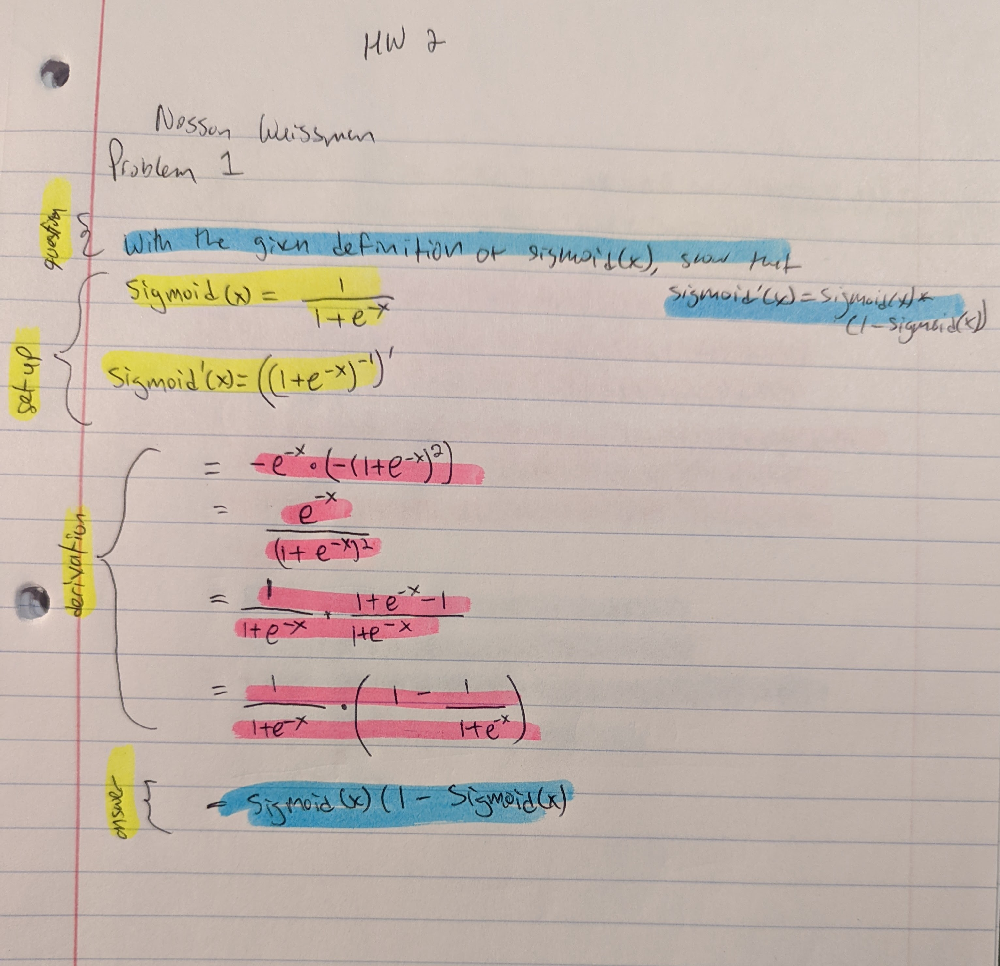

## Problem 2
Suppose we use the identity function as our activation function. (In Bramer’s notation, we would say 
that 𝑇ℎ𝑖𝑑𝑗=𝑊ℎ𝑖𝑑𝑗 and 𝑇𝑜𝑢𝑡𝑘=𝑊𝑜𝑢𝑡𝑘.) Show that the values for the outputs (𝑇𝑜𝑢𝑡1 and 𝑇𝑜𝑢𝑡2) 
can be expressed as a simple linear combination of the input values and biases. 
 
Note: This is what we mean when we say that we need a nonlinear activation function to model a 
nonlinear function. If we just use the identity, there is no real point to including hidden layers. 

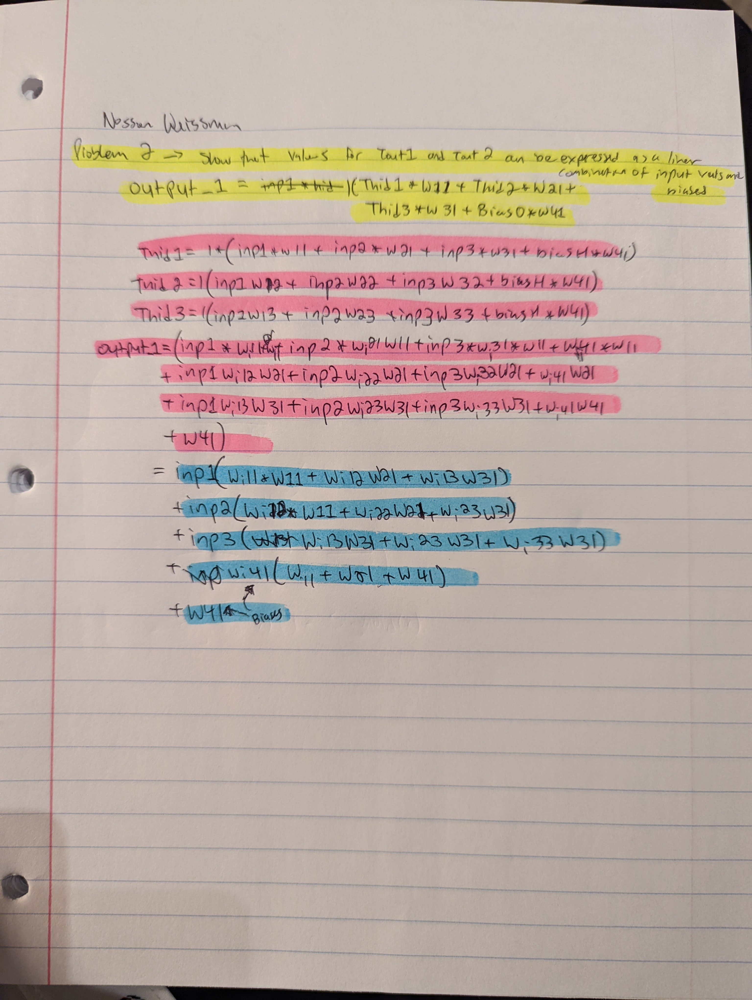

## Problem 3

### Part A: Forward Propagation

In [363]:
import numpy as np

In [364]:
def sigmoid(x):
    return 1/(1+np.exp(-x))

In [365]:
inp = np.array([4,8,6,1])
inp_to_hid_w = np.array([np.array([0.1, -0.4, -0.1,.2]),
                           np.array([0.3, 0.1, -0.2,.2]),
                           np.array([-0.2, 0.2, 0.4,.2])])
inp_to_hid_w_bias = 0.2 
hid_to_out_w = np.array([np.array([0.5, -0.3, 0.2, .3]),
                           np.array([0.2, -0.3, 0.1, .3])])
hid_to_out_w_bias = 0.3
target_output = np.array([0.65, 0.4])

In [366]:
inp_to_hid_w,inp

(array([[ 0.1, -0.4, -0.1,  0.2],
        [ 0.3,  0.1, -0.2,  0.2],
        [-0.2,  0.2,  0.4,  0.2]]),
 array([4, 8, 6, 1]))

In [367]:
hid_layer = sigmoid(np.dot(inp_to_hid_w,inp))
hid_layer = np.append(hid_layer, 1)
out_layer = sigmoid(np.dot(hid_to_out_w,hid_layer))
print("hidden layer: ", hid_layer,\
     "output layer: ", out_layer)

hidden layer:  [0.03916572 0.73105858 0.96770454 1.        ] output layer:  [0.5729277  0.54618944]


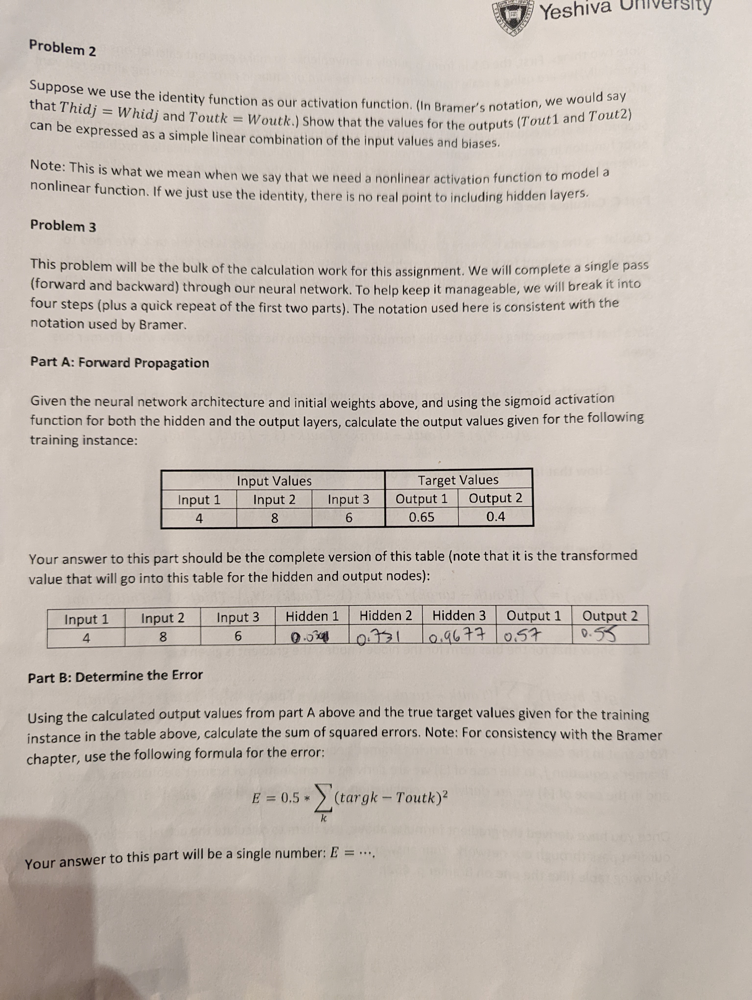

### Part B: Determine The Error

In [368]:
error = 0.5* ((target_output-out_layer)**2).sum()
error

0.013655745892345372

In [369]:
target_output,out_layer

(array([0.65, 0.4 ]), array([0.5729277 , 0.54618944]))

### Part C: Calculate The Gradients 
Note: I erroneously did not include the weights Wij in step 3 of part C
In the actual calculation I fixed that

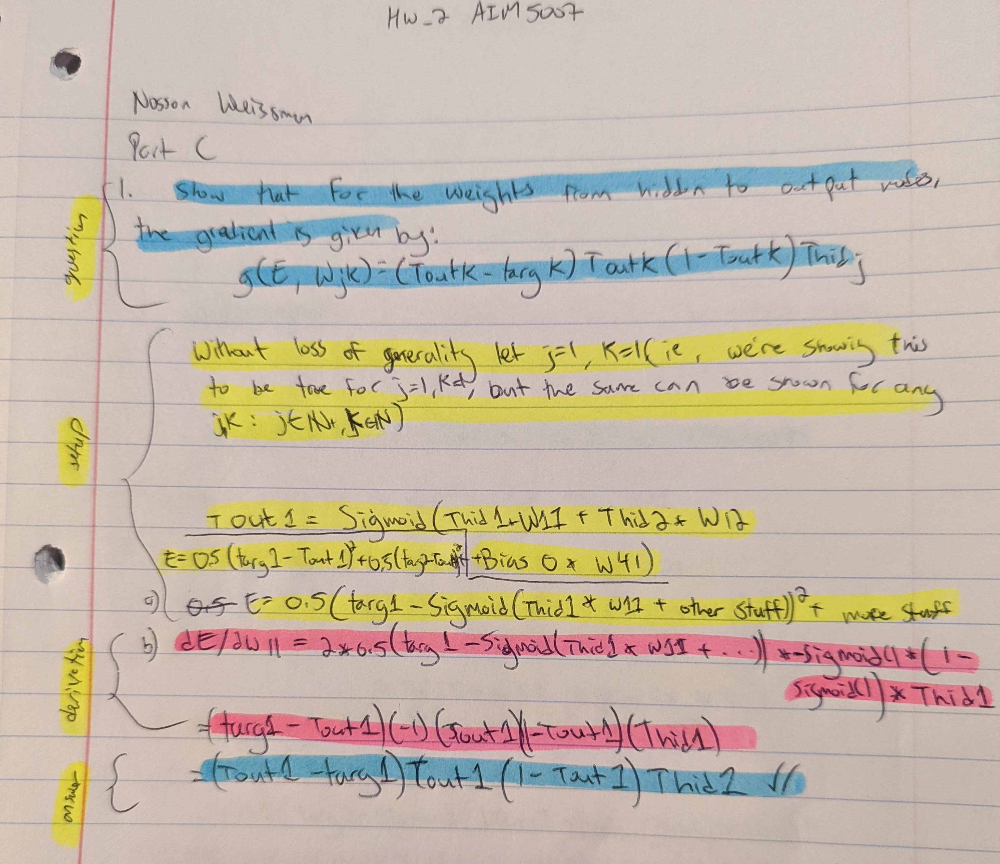

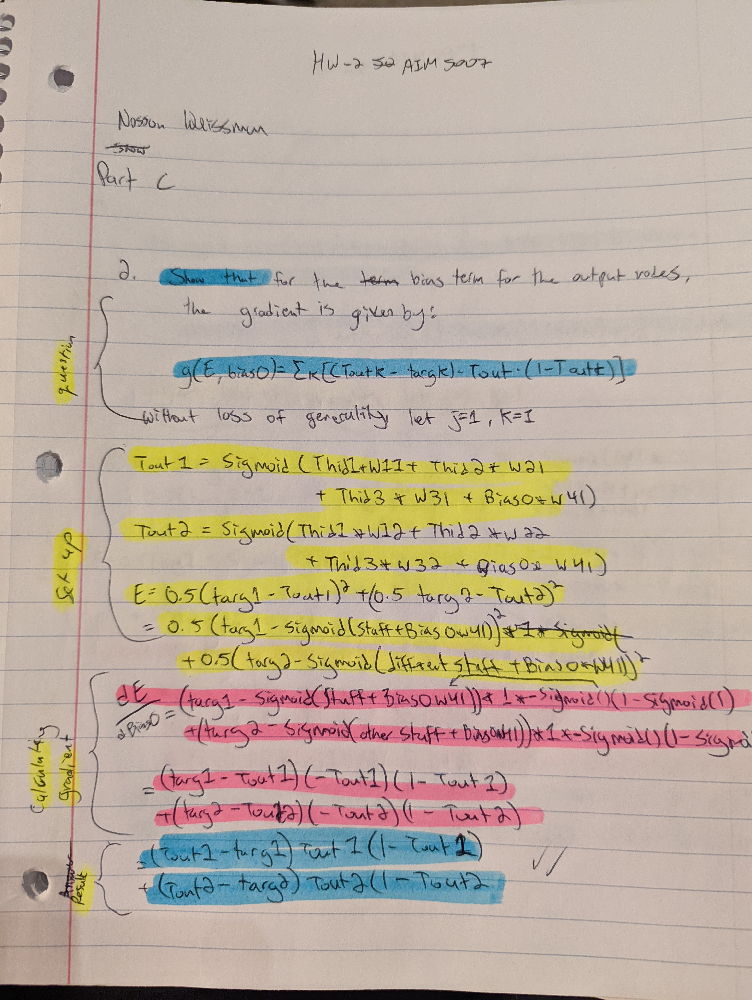

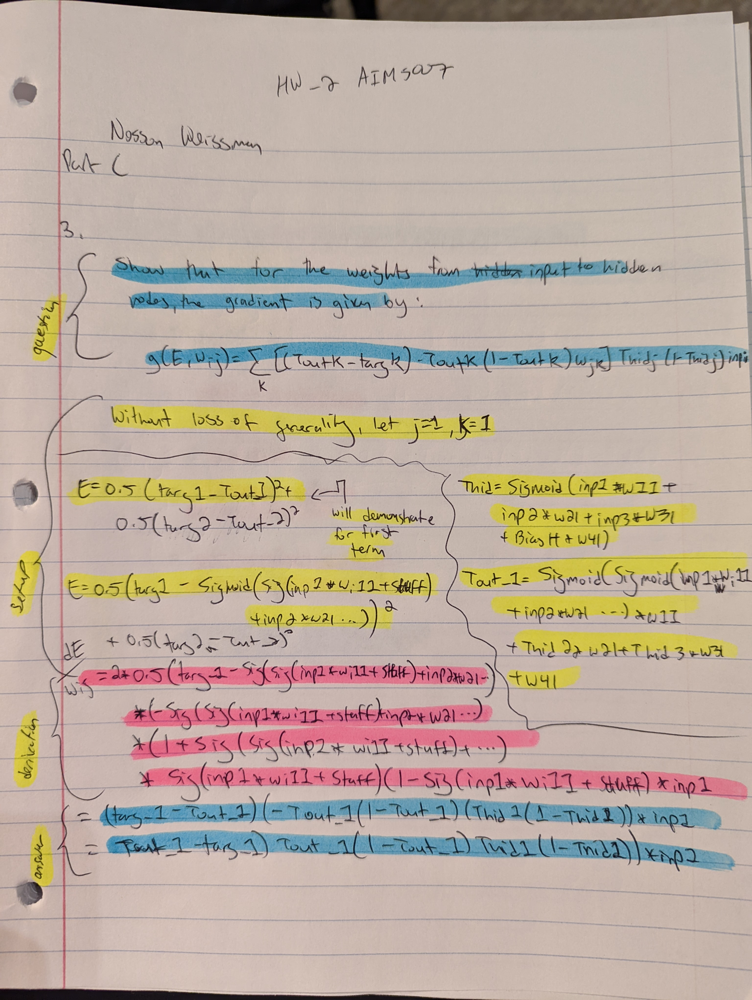

### Calclulate gradients:

In [370]:
#gradients
inp1,inp2,inp3, inp4 = inp
targ1, targ2 = target_output
Tout1, Tout2 = out_layer
Thid1, Thid2, Thid3, Thid4 = hid_layer
Wout = hid_to_out_w
inp_hid1 = (((Tout1-targ1)*Tout1*(1-Tout1)*Wout[0][0] + \
            (Tout2-targ2)*Tout2*(1-Tout2)*Wout[1][0])*Thid1*(1-Thid1)*inp)[:-1]
inp_hid2 = (((Tout1-targ1)*Tout1*(1-Tout1)*Wout[0][1] + \
            (Tout2-targ2)*Tout2*(1-Tout2)*Wout[1][1])*Thid2*(1-Thid2)*inp)[:-1]
inp_hid3 = (((Tout1-targ1)*Tout1*(1-Tout1)*Wout[0][2] + \
            (Tout2-targ2)*Tout2*(1-Tout2)*Wout[1][2])*Thid3*(1-Thid3)*inp)[:-1] 

hid_out1 = ((Tout1 - targ1) * Tout1 * (1- Tout1) *hid_layer)[:-1]
hid_out2 = ((Tout2 - targ2) * Tout2 * (1- Tout2) *hid_layer)[:-1]

hid_bias = (Tout1-targ1)*Tout1*(1-Tout1)*Wout[0][0]*Thid1*(1-Thid1) + \
            (Tout2-targ2)*Tout2*(1-Tout2)*Wout[1][0]*Thid1*(1-Thid1) +\
            (Tout1-targ1)*Tout1*(1-Tout1)*Wout[0][1]*Thid2*(1-Thid2) + \
            (Tout2-targ2)*Tout2*(1-Tout2)*Wout[1][1]*Thid2*(1-Thid2) +\
            (Tout1-targ1)*Tout1*(1-Tout1)*Wout[0][2]*Thid3*(1-Thid3) + \
            (Tout2-targ2)*Tout2*(1-Tout2)*Wout[1][2]*Thid3*(1-Thid3) 
out_bias = (Tout1-targ1)*Tout1*(1-Tout1 ) +\
            (Tout2-targ2)*Tout2*(1-Tout2 )
gradients=np.asarray([inp_hid1,inp_hid2,inp_hid3,
hid_out1,hid_out2,hid_bias,out_bias])

labels = ['inp_hid1: ', 'inp_hid2: ', 'inp_hid3: ', 'hid_out1: ', 'hid_out2: ', 'hid_bias: ', 'out_bias: ']

# for i in range(len(gradients)):
#     print(labels[i], gradients[i])

In [371]:
display(inp_hid3[0])

-1.851236444194025e-05

In [372]:
Tout1,targ1,hid_layer

(0.5729276960520869,
 0.65,
 array([0.03916572, 0.73105858, 0.96770454, 1.        ]))

In [373]:
print((Tout1-targ1),Tout1,(1-Tout1),Wout[0][0],Thid1,(1-Thid1))
print((Tout2-targ2),Tout2,(1-Tout2),Wout[1][0],Thid1,(1-Thid1))
print((Tout1-targ1),Tout1,(1-Tout1),Wout[0][1],Thid2,(1-Thid2))
print((Tout2-targ2),Tout2,(1-Tout2),Wout[1][1],Thid2,(1-Thid2))
print((Tout1-targ1),Tout1,(1-Tout1),Wout[0][2],Thid3,(1-Thid3))
print((Tout2-targ2),Tout2,(1-Tout2),Wout[1][2],Thid3,(1-Thid3))

-0.07707230394791309 0.5729276960520869 0.42707230394791307 0.5 0.039165722796764356 0.9608342772032357
0.14618943788403882 0.5461894378840388 0.45381056211596116 0.2 0.039165722796764356 0.9608342772032357
-0.07707230394791309 0.5729276960520869 0.42707230394791307 -0.3 0.7310585786300049 0.2689414213699951
0.14618943788403882 0.5461894378840388 0.45381056211596116 -0.3 0.7310585786300049 0.2689414213699951
-0.07707230394791309 0.5729276960520869 0.42707230394791307 0.2 0.9677045353015495 0.03229546469845046
0.14618943788403882 0.5461894378840388 0.45381056211596116 0.1 0.9677045353015495 0.03229546469845046


### Gradients are as follows
<pre>
inp_hid1:  [-0.00032845 -0.0006569  -0.00049267]
inp_hid2:  [-0.0040999  -0.0081998  -0.00614985]
inp_hid3:  [-1.85123644e-05 -3.70247289e-05 -2.77685467e-05]
hid_out1:  [-0.00073859 -0.01378643 -0.01824914]
hid_out2:  [0.00141919 0.02649025 0.03506523]
hid_bias:  -0.001111715577649891
out_bias:  0.017377298662386242
<pre>

### Part D: Update The Weights

In [374]:
#alpha is learning rate
alpha = 0.2

In [375]:
old_inp_to_hid_w = np.array([np.array([0.1, -0.4, -0.1]),
                           np.array([0.3, 0.1, -0.2]),
                           np.array([-0.2, 0.2, 0.4])])
inp_to_hid_gradients = np.array([inp_hid1,
                                 inp_hid2,
                                 inp_hid3])
hid_to_out_gradients = np.array([hid_out1, hid_out2])

In [376]:
old_hid_to_out_w =  np.array([np.array([0.5, -0.3, 0.2]),
                           np.array([0.2, -0.3, 0.1])])
hid_to_out_gradients = np.array([hid_out1, hid_out2])

In [377]:
old_biases = np.array([0.2, 0.3])
bias_gradients = np.array([hid_bias, out_bias])
updated_biases = old_biases - alpha*bias_gradients
updated_biases

array([0.20022234, 0.29652454])

**update hid and out layers**

In [378]:
old_inp_to_hid_w, alpha,inp_to_hid_gradients

(array([[ 0.1, -0.4, -0.1],
        [ 0.3,  0.1, -0.2],
        [-0.2,  0.2,  0.4]]),
 0.2,
 array([[-3.28448805e-04, -6.56897609e-04, -4.92673207e-04],
        [-4.09990114e-03, -8.19980228e-03, -6.14985171e-03],
        [-1.85123644e-05, -3.70247289e-05, -2.77685467e-05]]))

In [379]:
updated_hid_to_out_w = old_hid_to_out_w - alpha*hid_to_out_gradients
updated_inp_to_hid_w = old_inp_to_hid_w - alpha*inp_to_hid_gradients

**insert updated biases for hid and out layers:**

In [380]:
updated_inp_to_hid_w = np.insert(updated_inp_to_hid_w, 3,updated_biases[0], axis=1)
updated_hid_to_out_w = np.insert(updated_hid_to_out_w, 3,updated_biases[1], axis=1)

### Show updated weights:
<pre>
Updated inp_to_hid_w:
 [[ 0.10006569 -0.39986862 -0.09990147  0.20022234]
 [ 0.30081998  0.10163996 -0.19877003  0.20022234]
 [-0.1999963   0.2000074   0.40000555  0.20022234]] 
Updated hid_to_out_w:
 [[ 0.50014772 -0.29724271  0.20364983  0.29652454]
 [ 0.19971616 -0.30529805  0.09298695  0.29652454]] 
Updated biases:
 [0.20022234 0.29652454]
 </pre>

In [381]:
# print("Updated inp_to_hid_w:\n",updated_inp_to_hid_w, 
#       "\nUpdated hid_to_out_w:\n",updated_hid_to_out_w, 
#       "\nUpdated biases:\n",updated_biases)

In [382]:
updated_hid_layer = np.append(sigmoid(np.dot(updated_inp_to_hid_w,inp)),1)
updated_out_layer = sigmoid(np.dot(updated_hid_to_out_w, updated_hid_layer))

### Show updated layers:
<pre>
updated_hid_layer:  [0.03924586 0.73575136 0.96771484 1.        ]
updated_out_layer:  [0.57310515 0.54232943]
</pre>

In [383]:
# print('updated_hid_layer: ', updated_hid_layer)
# print('updated_out_layer: ', updated_out_layer)

In [384]:
updated_error = 0.5*((target_output-updated_out_layer)**2).sum()
# print('error: ', error)
# print('updated_error: ', (updated_error))

### New error (notice the improvement over forward-propagation error)
<pre>
error:  0.013655745892345372
updated_error:  0.013085241854687813
</pre>